# HSMA 3B: Exercise 4 - Enhancing our Static Map Plots

*The first cell only needs to be run if running in colab!* 

In [ ]:
!git clone https://github.com/hsma-programme/h6_3b_advanced_qgis_mapping_python.git
%cd /content/h6_3b_advanced_qgis_mapping_python/h6_3b_advanced_qgis_and_mapping_in_python/solutions
!pip install contextily

Import the required packages.

In [1]:
import pandas as pd
import geopandas

# import the package for adding basemaps
import contextily as cx
# import matplotlib.pyplot with the standard alias so we can access more advanced plot options
import matplotlib.pyplot as plt

## Core

### stats19 - Point Data

C:\Users\Sammi\AppData\Local\Temp\ipykernel_24672\124294725.py:1: DtypeWarning: Columns (0,1) have mixed types. Specify dtype option on import or set low_memory=False.
  stats19_collisions = pd.read_csv("../datasets/exercise_4/stats19_collisions_point_data_2022.csv")


<Axes: >

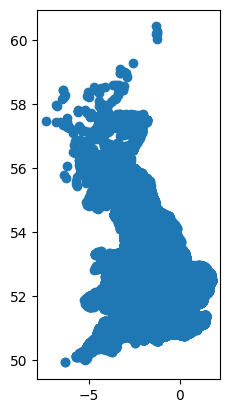

In [4]:
stats19_collisions = pd.read_csv("../datasets/exercise_4/stats19_collisions_point_data_2022.csv")

stats19_collisions_gdf = geopandas.GeoDataFrame(
    stats19_collisions,
    geometry = geopandas.points_from_xy(
        stats19_collisions['longitude'],
        stats19_collisions['latitude'],
    ),
    crs = 'EPSG:4326'
)

stats19_collisions_gdf.plot()

We want to add a basemap to our map.

We'd like to use EPSG 27700 for this, so we need to convert our dataframe using the '.to_crs()' method.

<Axes: >

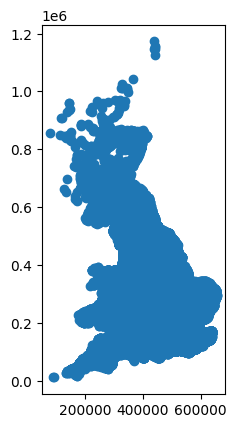

In [5]:
stats19_collisions_gdf_27700 = stats19_collisions_gdf.to_crs("EPSG:27700")
stats19_collisions_gdf_27700.plot()

Now we can add a basemap. Start with a zoom level of 7.

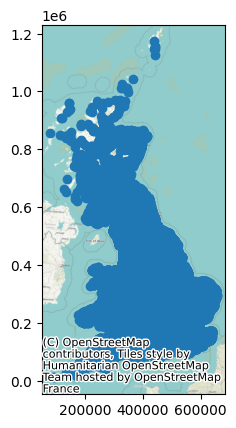

In [6]:
ax = stats19_collisions_gdf_27700.plot()

cx.add_basemap(
    ax,
    crs=stats19_collisions_gdf_27700.crs.to_string(),
    zoom=7
)

Let's just zoom down to an area of the map. 

Plot the results again with a basemap. Do you need to change the zoom level of the basemap now? 

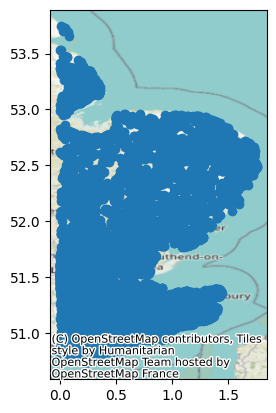

In [10]:
xmin, xmax = 0, 350000
ymin, ymax = 0, 160000

stats19_collisions_gdf_27700_se = stats19_collisions_gdf.cx[xmin:xmax, ymin:ymax]

ax = stats19_collisions_gdf_27700_se.plot()

cx.add_basemap(
    ax,
    crs=stats19_collisions_gdf_27700_se.crs.to_string(),
    zoom=7
)

Let's colour the points by the 'accident severity' column.

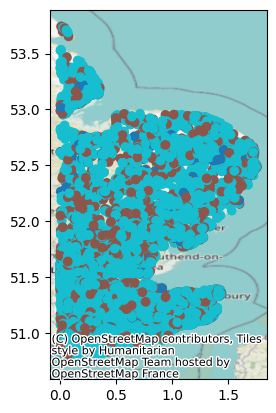

In [11]:
ax = stats19_collisions_gdf_27700_se.plot(column="accident_severity")

cx.add_basemap(
    ax,
    crs=stats19_collisions_gdf_27700_se.crs.to_string(),
    zoom=7
)

Let's now add a legend.

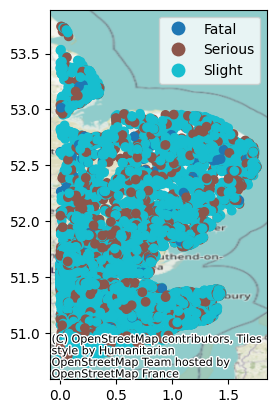

In [12]:
ax = stats19_collisions_gdf_27700_se.plot(column="accident_severity", legend=True)

cx.add_basemap(
    ax,
    crs=stats19_collisions_gdf_27700_se.crs.to_string(),
    zoom=7
)

Finally, let's bring it all together. 

Plot the accident severity column, including a legend in your plot, and add a basemap.

In addition, you should
- turn the axis tick marks and labels off
- increase the size of the map to a figsize of (15, 10)
- set the opacity of the points to 0.6
- adjust the point size

(-0.08798515000000001, 1.84782015, 50.586789749999994, 53.89214125)

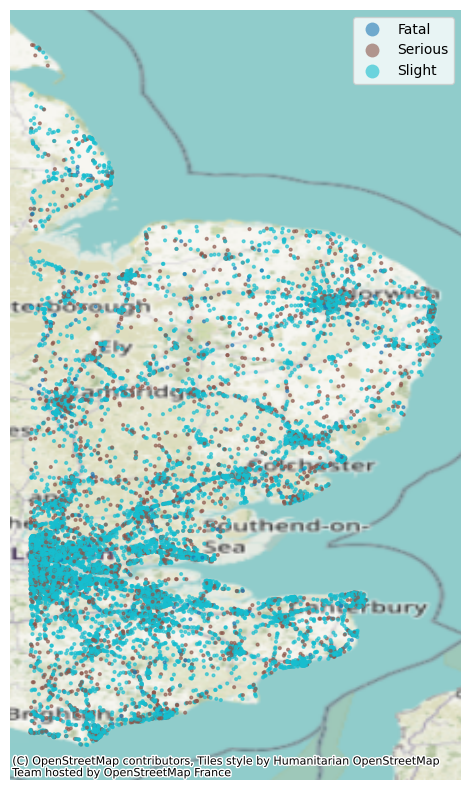

In [56]:
ax = stats19_collisions_gdf_27700_se.plot(
    column="accident_severity",
    legend=True,
    alpha=0.6,
    figsize=(15,10),
    markersize=4
    )

cx.add_basemap(
    ax,
    crs=stats19_collisions_gdf_27700_se.crs.to_string(),
    zoom=7
)

ax.axis('off')

### stats19 - choropleths

Let's now look at what we can do with choropleths

In [15]:
stats19_choro_gdf = geopandas.read_file("../datasets/exercise_4/stats_19_counts_by_msoa_normalised_3857.geojson")

First, let's change the CRS to EPSG 27700.

In [16]:
stats19_choro_gdf_27700 = stats19_choro_gdf.to_crs('EPSG:27700')

Let's see what columns we have available to us for plotting. Look at the columns **attribute** of the geodataframe.

In [17]:
stats19_choro_gdf_27700.columns

Index(['MSOA11CD', 'MSOA11NM', 'MSOA11NMW', 'BNG_E', 'BNG_N', 'LONG', 'LAT',
       'GlobalID', 'total_number_of_collisions_2018_2022',
       'total_number_of_casualties_by_casualty_lsoa_2018_2022',
       'total_number_of_casualties_by_msoa_of_accident_2018_2022',
       'fatal_casualties_2018_2022', 'cyclist_casualties_2018_2022',
       'pedestrian_casualties_2018_2022', 'car_occupant_casualties_2018_2022',
       'motorcycle_casualties_2018_2022', 'horse_rider_casualties_2018_2022',
       'snow_collisions_2018_2022', 'fog_or_mist_collisions_2018_2022',
       'darkness_collisions_2018_2022', 'daylight_collisions_2018_2022',
       'summer_collisions_2018_2022', 'winter_collisions_2018_2022',
       'fatal_casualties_2018_2022_rate', 'cyclist_casualties_2018_2022_rate',
       'pedestrian_casualties_2018_2022_rate',
       'horse_rider_casualties_2018_2022_rate',
       'car_occupant_casualties_2018_2022_rate',
       'motorcycle_casualties_2018_2022_rate',
       'snow_collisions

Let's plot the contents of the column 'fog_or_mist_collisions_2018_2022_rate'.

Increase the plot size to (15,10)

<Axes: >

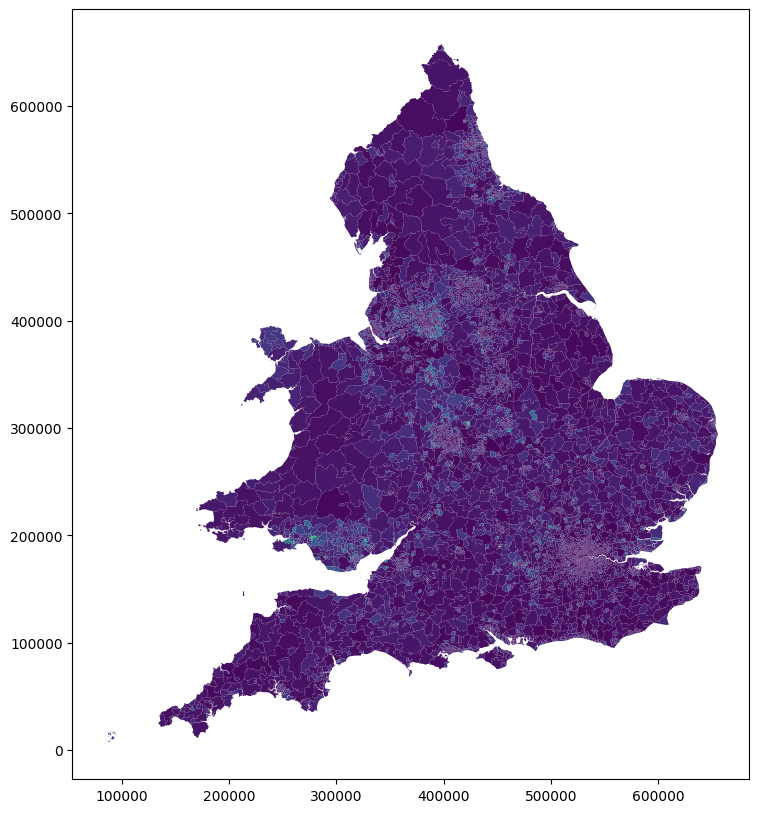

In [18]:
stats19_choro_gdf_27700.plot(
    column='fog_or_mist_collisions_2018_2022_rate',
    figsize=(15,10)
    )

Now let's make some extra enhancements. 

- change the colourscheme to "Blues"
- set the polygon boundary width to 250,000 - 550,000 on the x axis and 350,000 to 700,000 on the y axis (a Northern section of the UK)
- add a legend
- turn off the axis tickmarks and labels
- add a title
- making the edges between each polygon (area) black 

*Hint: try setting the `linewidth` parameter after you have set the polygon edges to black - it can be a decimal...*

(219677.13497274573, 573343.9787502342, 316771.1966670983, 673760.9058816987)

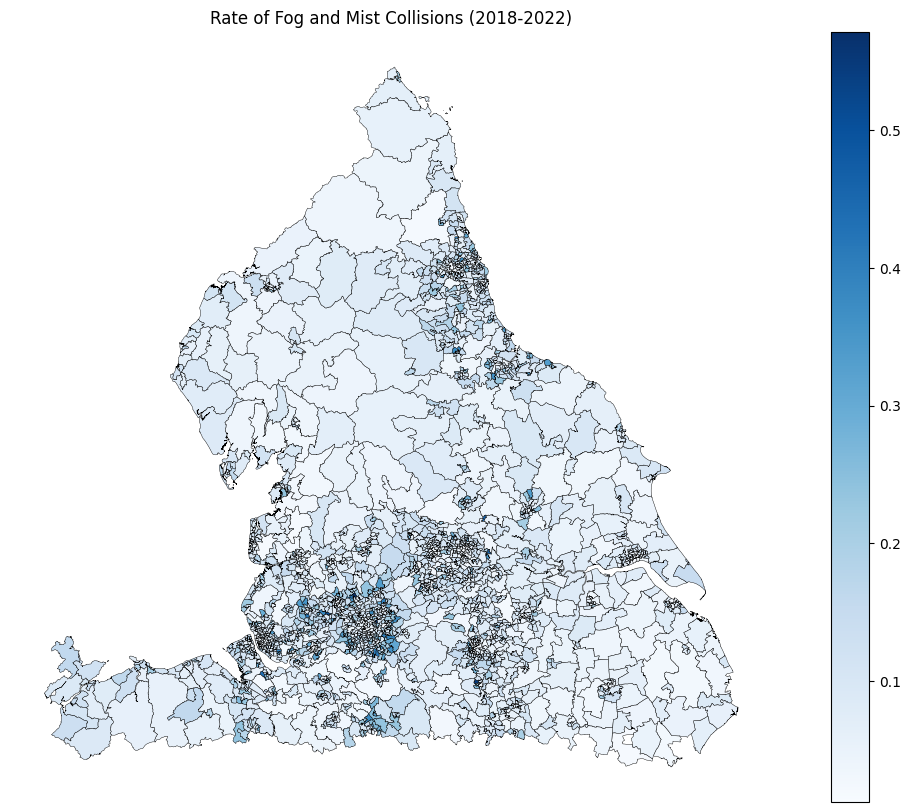

In [40]:
xmin, xmax = 250000, 550000
ymin, ymax = 350000, 700000
stats19_choro_gdf_27700_north = stats19_choro_gdf_27700.cx[xmin:xmax, ymin:ymax]

ax = stats19_choro_gdf_27700_north.plot(
    column='fog_or_mist_collisions_2018_2022_rate',
    figsize=(15,10),
    legend=True,
    cmap='Blues',
    edgecolor='black',
    linewidth=0.3
    )

plt.title("Rate of Fog and Mist Collisions (2018-2022)")

ax.axis('off')

## Extension

Now let's make a series of subplots for the columns that show a rate.

The code below will just filter the dataframe down to those columns, plus our geometry and MSOA columns.

I've added code to filter down to just Wales (more or less).

<Axes: >

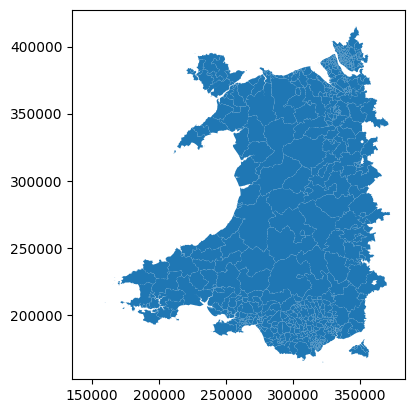

In [79]:
stats19_choro_gdf_27700_wales = stats19_choro_gdf_27700.cx[150000:350000 , 175000:400000 ]
stats19_choro_gdf_27700_wales.plot()

In [80]:
rate_column_list = stats19_choro_gdf_27700_wales.columns[stats19_choro_gdf_27700_wales.columns.str.contains('rate')]
rate_column_list

Index(['fatal_casualties_2018_2022_rate', 'cyclist_casualties_2018_2022_rate',
       'pedestrian_casualties_2018_2022_rate',
       'horse_rider_casualties_2018_2022_rate',
       'car_occupant_casualties_2018_2022_rate',
       'motorcycle_casualties_2018_2022_rate',
       'snow_collisions_2018_2022_rate',
       'fog_or_mist_collisions_2018_2022_rate',
       'darkness_collisions_2018_2022_rate',
       'daylight_collisions_2018_2022_rate',
       'summer_collisions_2018_2022_rate', 'winter_collisions_2018_2022_rate'],
      dtype='object')

First, count how many columns there are so we can work out how to lay out our subplots.

In [32]:
len(rate_column_list)

12

Now let's create our subplots. You can use the 'Blues' colourmap again, or choose a different colourmap.

https://matplotlib.org/stable/users/explain/colors/colormaps.html



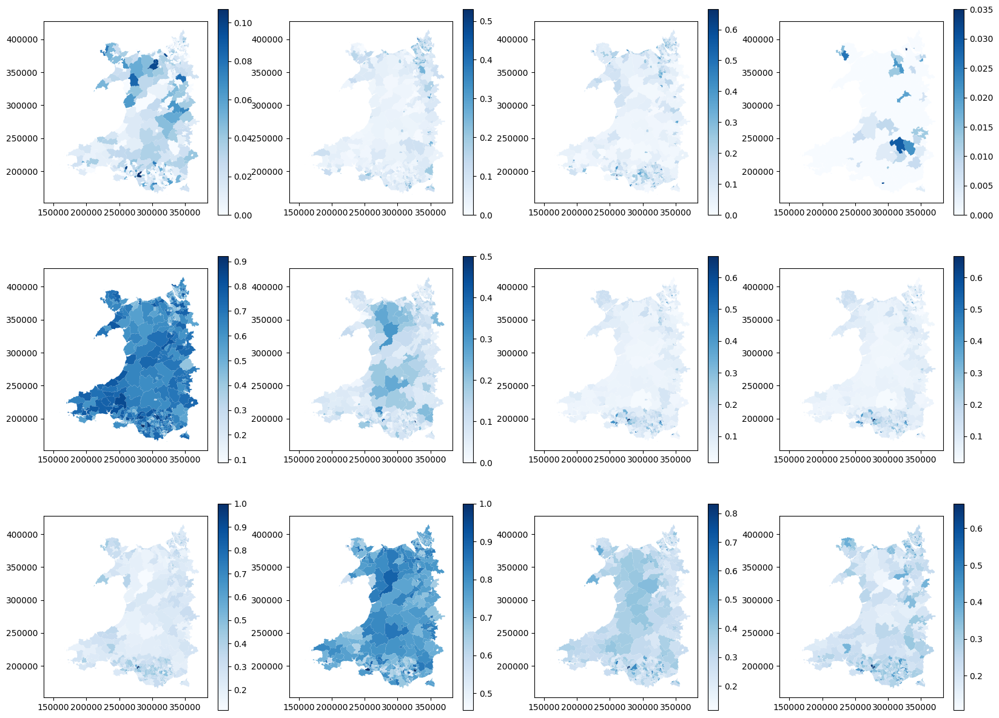

In [82]:
fig, axs = plt.subplots(3, 4, figsize=(20,15))

for i,ax in enumerate(fig.axes):
    ax = stats19_choro_gdf_27700_wales.plot(
    column=rate_column_list[i],
    figsize=(15,10),
    legend=True,
    cmap='Blues',
    ax=ax
    )

Finally, let's enhance our subplots by
- turning the axis off
- adding the column name as a title (don't worry about it being ugly!)

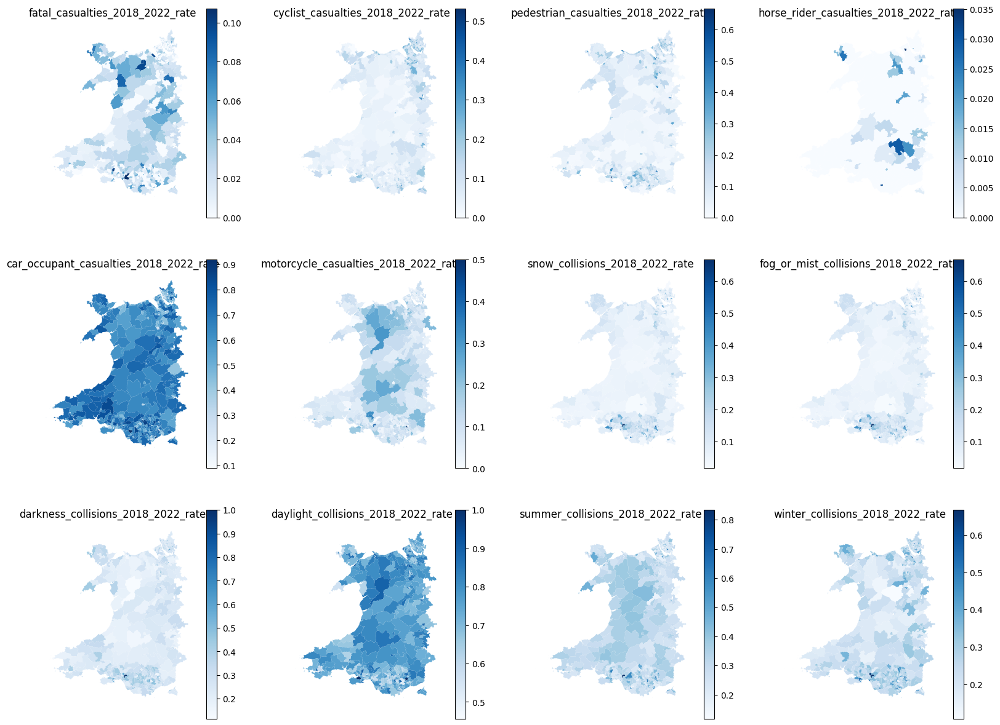

In [85]:
fig, axs = plt.subplots(3, 4, figsize=(20,15))

for i,ax in enumerate(fig.axes):
    ax = stats19_choro_gdf_27700_wales.plot(
    column=rate_column_list[i],
    figsize=(15,10),
    legend=True,
    cmap='Blues',
    ax=ax
    )

    ax.title.set_text(rate_column_list[i])

    ax.axis('off')

### 3. A dental dataset

We're now going to work with a dataset of dentist activity for December 2023.

I've imported the dataset and filtered it to a region of the Northwest. The first 5 rows of the dataframe are shown below.


The data dictionary for this dataframe can be viewed here: https://opendata.nhsbsa.net/dataset/english-contractor-monthly-general-dental-activity/resource/e9e0e230-5667-4e48-9746-0ffcea11938a

In [43]:
dentist_activity_dec_2023 = geopandas.read_file("../datasets/exercise_4/dentist_activity_dec_2023.geojson")
dentist_activity_dec_2023 = dentist_activity_dec_2023[dentist_activity_dec_2023['result_nhs_ha'] =="North West"]
dentist_activity_dec_2023 = dentist_activity_dec_2023.cx[:,450000:]
dentist_activity_dec_2023.head()

,PROVIDER_NAME,LATEST_PPC_ADDRESS_POSTCODE,LSOA11_CODE,result_eastings,result_northings,result_nhs_ha,result_longitude,result_latitude,CONTRACT_NUMBER,UDA_PERF_TARGET,...,BAND_2A_DELIVERED,BAND_2B_DELIVERED,BAND_2C_DELIVERED,BAND_3_DELIVERED,BAND_URGENT_DELIVERED,BAND_OTHER_DELIVERED,CHILD_12M_COUNT,ADULT_24M_COUNT,GENERAL_DENTAL_FIN_VALUE,geometry
137,Alistair Morgan and Associates Limited,LA23 2EQ,E01019396,340956.0,497750.0,North West,-2.910366,54.371828,1340150001,1700,...,8.0,1.0,0.0,0.0,0.0,0.0,335.0,57.0,52167.17,POINT (340956.000 497750.000)
274,BROCK STREET DENTAL PRACTICE LTD,LA1 1UU,E01033071,347795.0,461559.0,North West,-2.798801,54.047339,1997100001,33078,...,211.0,69.0,12.0,44.0,254.0,12.0,2445.0,10528.0,1169250.24,POINT (347795.000 461559.000)
344,Barrow Smile Clinic Ltd,LA14 5SL,E01019157,319744.0,469686.0,North West,-3.229282,54.116755,1033960000,17242,...,129.0,74.0,2.0,20.0,141.0,0.0,716.0,1182.0,532663.75,POINT (319744.000 469686.000)
409,Bismillah Smile Studio,CA17 4QT,E01019318,377509.0,508708.0,North West,-2.348567,54.473240,7011810001,7400,...,1.0,0.0,0.0,0.0,0.0,0.0,200.0,15.0,235282.99,POINT (377509.000 508708.000)
569,Campbell and Wilson Dental Practice,CA1 1JP,E01019206,340643.0,555635.0,North West,-2.926938,54.891911,2039470001,1839,...,10.0,3.0,0.0,0.0,2.0,0.0,756.0,96.0,53190.88,POINT (340643.000 555635.000)


<Axes: >

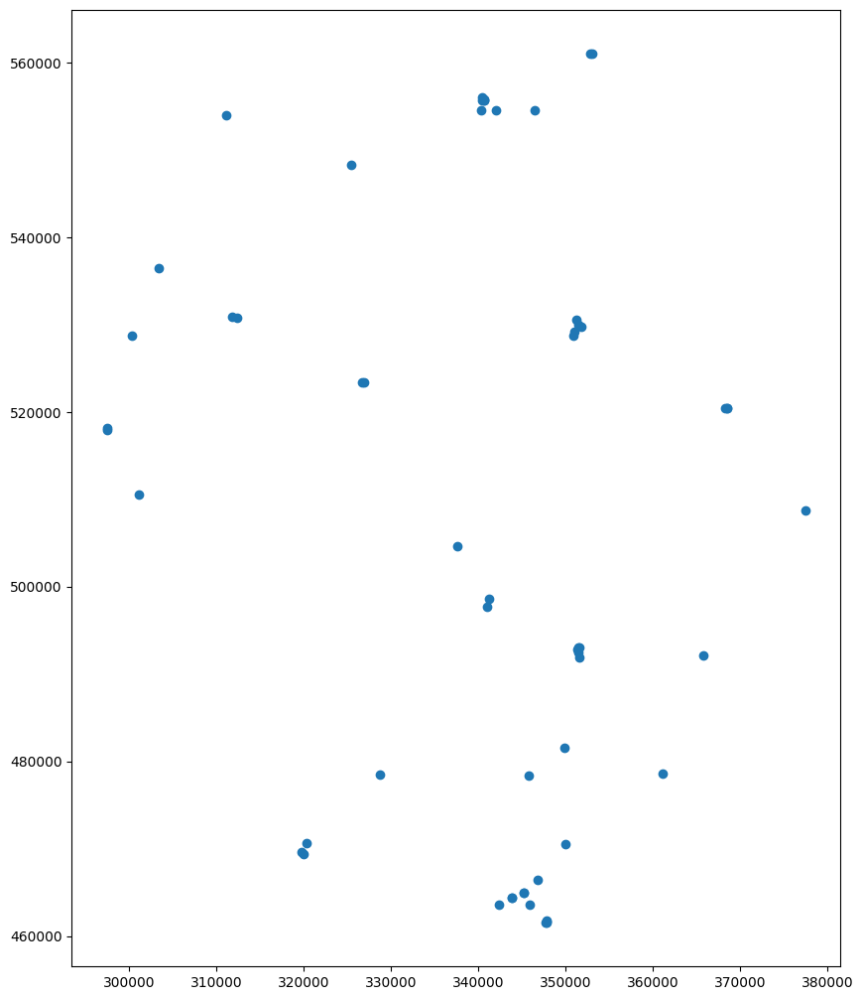

In [44]:
dentist_activity_dec_2023.plot(figsize=(10,15))

Add a basemap.

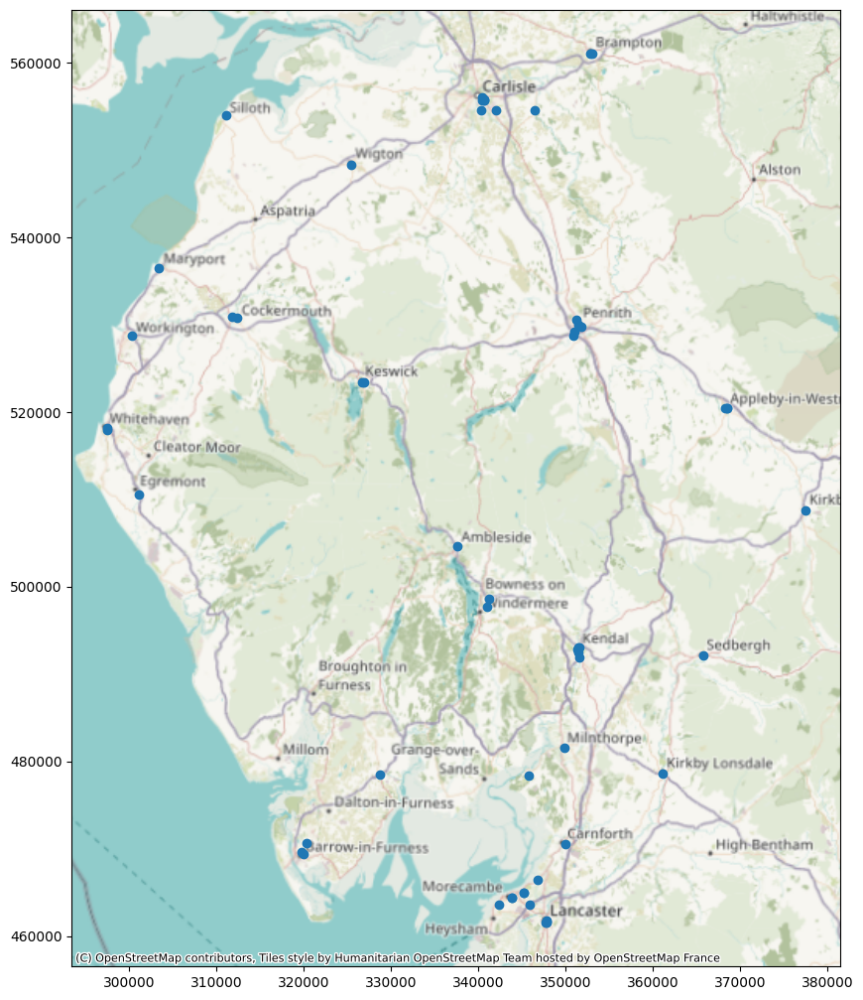

In [47]:
ax = dentist_activity_dec_2023.plot(figsize=(10,15))

cx.add_basemap(
    ax,
    crs=dentist_activity_dec_2023.crs.to_string(),
    zoom=9
)


Add the practice name as a label.

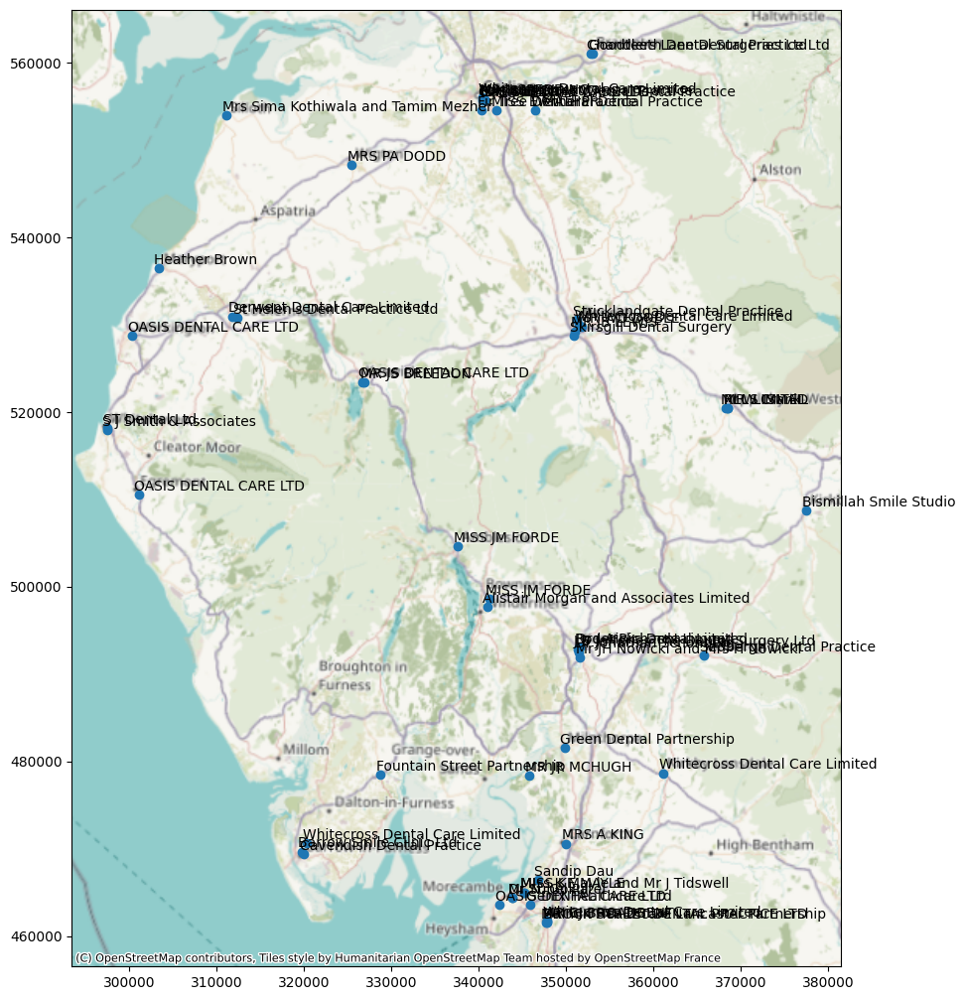

In [60]:
ax = dentist_activity_dec_2023.plot(figsize=(10,15))

cx.add_basemap(
    ax,
    crs=dentist_activity_dec_2023.crs.to_string(),
    zoom=9
)

for x, y, label in zip(dentist_activity_dec_2023.geometry.x, dentist_activity_dec_2023.geometry.y, dentist_activity_dec_2023.PROVIDER_NAME):
    ax.annotate(label, xy=(x,y), xytext=(-3,3), textcoords="offset points")


Try using the adjust_text and textwrap packages to improve the layout of the labels so they are more readable. 

Note: No matter how hard you try, it may be difficult to get the labels to display nicely here. This can work well for smaller maps with fewer/shorter labels, but it's not a solution in all cases. Just try it out and see what improvement it makes over the unprocessed labels.

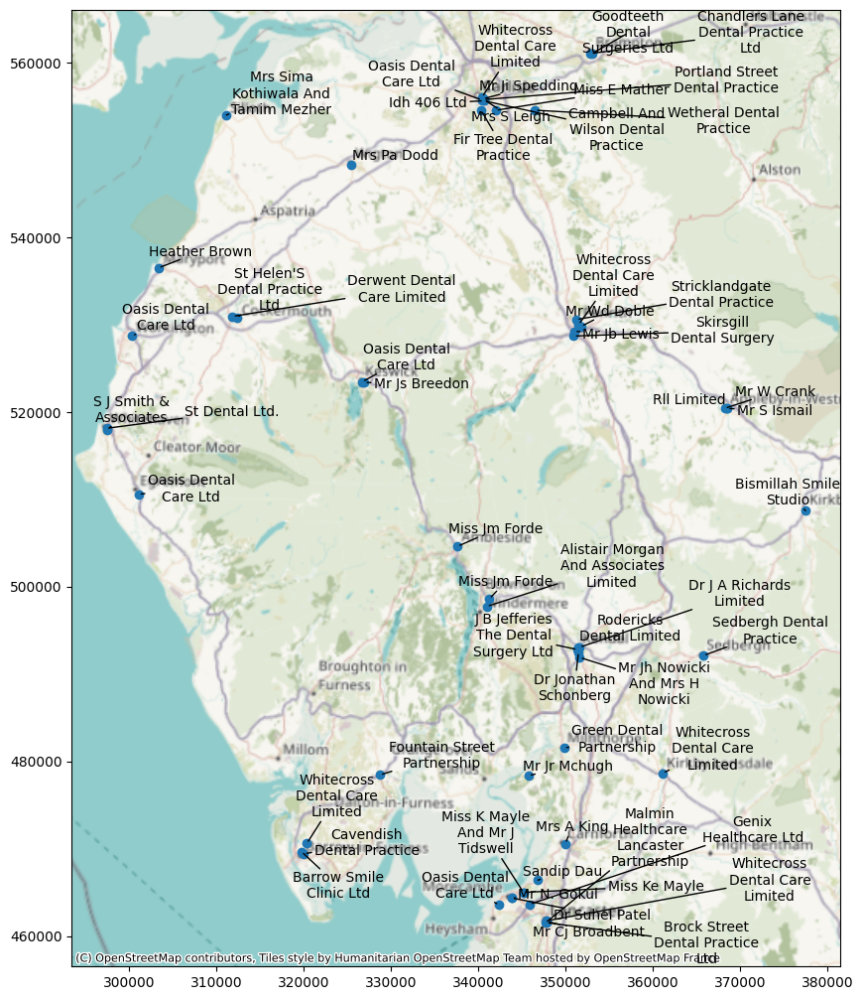

In [68]:
import textwrap
from adjustText import adjust_text

ax = dentist_activity_dec_2023.plot(figsize=(10,15))

cx.add_basemap(
    ax,
    crs=dentist_activity_dec_2023.crs.to_string(),
    zoom=9
)

texts = []

for x, y, label in zip(dentist_activity_dec_2023.geometry.x, dentist_activity_dec_2023.geometry.y, dentist_activity_dec_2023.PROVIDER_NAME):
    wrapped_label = textwrap.fill(label,15).title()
    texts.append(plt.text(x, y, wrapped_label))

adjust_text(
    texts,
    force_explode=(0.1,0.05),
    arrowprops=dict(arrowstyle="-", color='k', lw=1),
    time_lim=5
)


Colour the practices by 'UDA_DELIVERED'

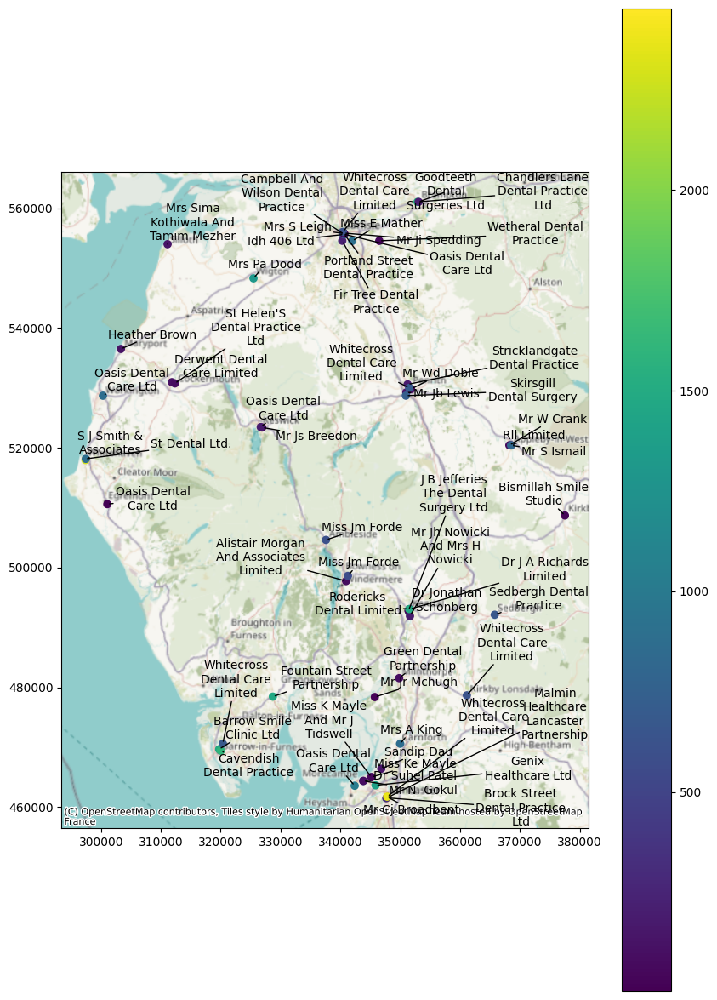

In [75]:
ax = dentist_activity_dec_2023.plot(
    figsize=(10,15),
    column="UDA_DELIVERED",
    legend=True
    )

cx.add_basemap(
    ax,
    crs=dentist_activity_dec_2023.crs.to_string(),
    zoom=9
)

texts = []

for x, y, label in zip(dentist_activity_dec_2023.geometry.x, dentist_activity_dec_2023.geometry.y, dentist_activity_dec_2023.PROVIDER_NAME):
    wrapped_label = textwrap.fill(label,15).title()
    texts.append(plt.text(x, y, wrapped_label))

adjust_text(
    texts,
    force_explode=(0.1,0.05),
    arrowprops=dict(arrowstyle="-", color='k', lw=1),
    time_lim=5
)


Adjust the size of the values by 'UDA_DELIVERED'.

HINT: You may need to make a new column based on 'UDA_DELIVERED' and adjust it by dividing it so that the points aren't too big.

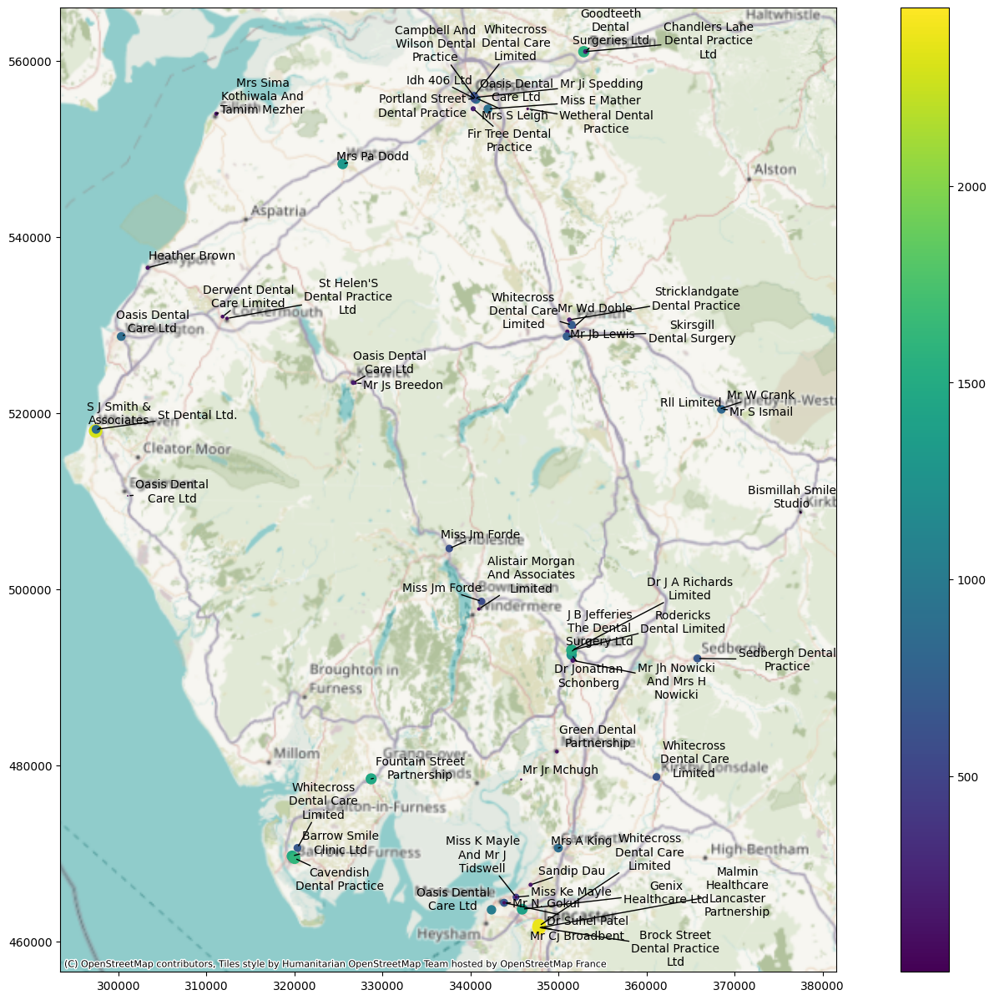

In [77]:
dentist_activity_dec_2023['point_size'] = dentist_activity_dec_2023['UDA_DELIVERED'] / 20

ax = dentist_activity_dec_2023.plot(
    figsize=(20,15),
    column="UDA_DELIVERED",
    markersize=dentist_activity_dec_2023['point_size'],
    legend=True
    )

cx.add_basemap(
    ax,
    crs=dentist_activity_dec_2023.crs.to_string(),
    zoom=9
)

texts = []

for x, y, label in zip(dentist_activity_dec_2023.geometry.x, dentist_activity_dec_2023.geometry.y, dentist_activity_dec_2023.PROVIDER_NAME):
    wrapped_label = textwrap.fill(label,15).title()
    texts.append(plt.text(x, y, wrapped_label))

adjust_text(
    texts,
    force_explode=(0.1,0.05),
    arrowprops=dict(arrowstyle="-", color='k', lw=1),
    time_lim=5
)


Tidy up your map by 
- adding a title
- removing the axis values and tickmarks

Text(0.5, 1.0, 'Units of Dental Activity Delivered')

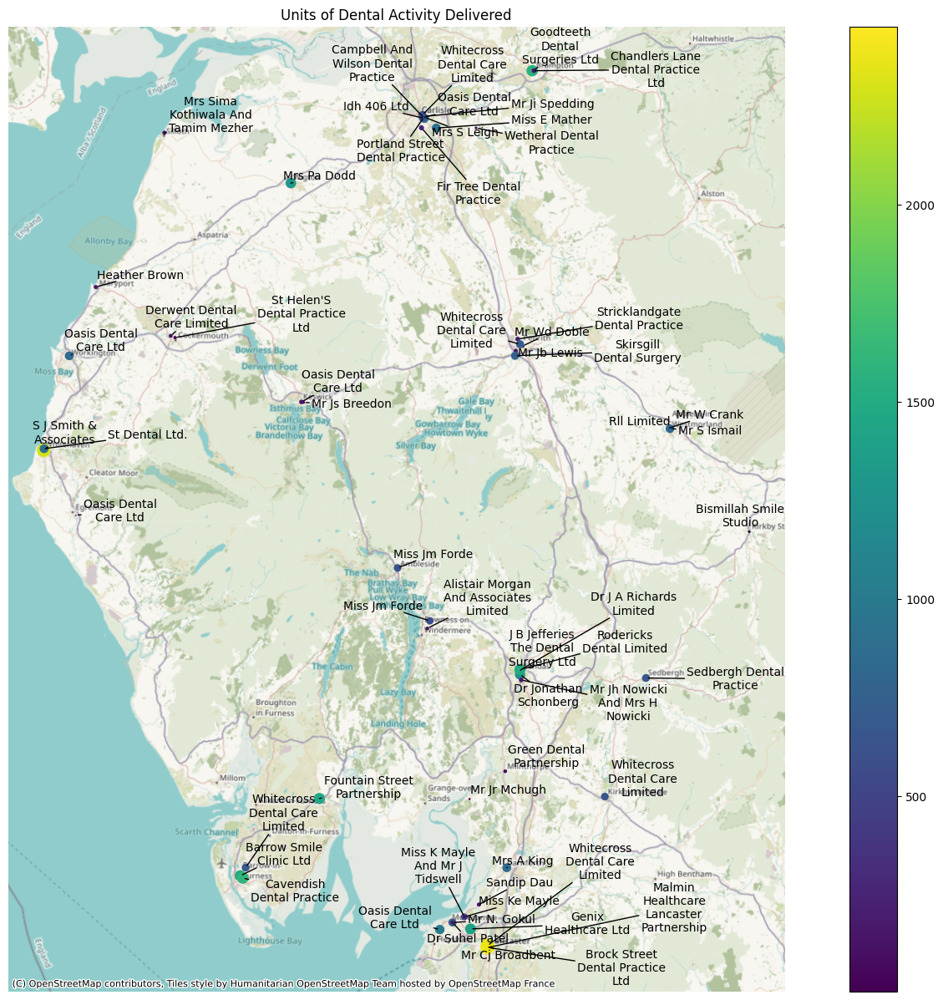

In [86]:
dentist_activity_dec_2023['point_size'] = dentist_activity_dec_2023['UDA_DELIVERED'] / 20

ax = dentist_activity_dec_2023.plot(
    figsize=(20,15),
    column="UDA_DELIVERED",
    markersize=dentist_activity_dec_2023['point_size'],
    legend=True
    )

cx.add_basemap(
    ax,
    crs=dentist_activity_dec_2023.crs.to_string(),
    zoom=10
)

texts = []

for x, y, label in zip(dentist_activity_dec_2023.geometry.x, dentist_activity_dec_2023.geometry.y, dentist_activity_dec_2023.PROVIDER_NAME):
    wrapped_label = textwrap.fill(label,15).title()
    texts.append(plt.text(x, y, wrapped_label))

adjust_text(
    texts,
    force_explode=(0.1,0.05),
    arrowprops=dict(arrowstyle="-", color='k', lw=1),
    time_lim=5
)

ax.axis('off')

plt.title("Units of Dental Activity Delivered")

## Challenge: Bonus Exercises

### 1. Create an inset map of a region of interest in your North England fog and mist collisions map

Take a look at the slides here on creating inset maps.

[LINK](https://docs.google.com/presentation/d/1nJ5Qmh7K5CXttRn_4eN5UzcVY5FBXqNiQCXW7BoDQ5s/edit?usp=sharing)

Try to adapt this code for your own map.

(360000.0, 410000.0, 375000.0, 425000.0)

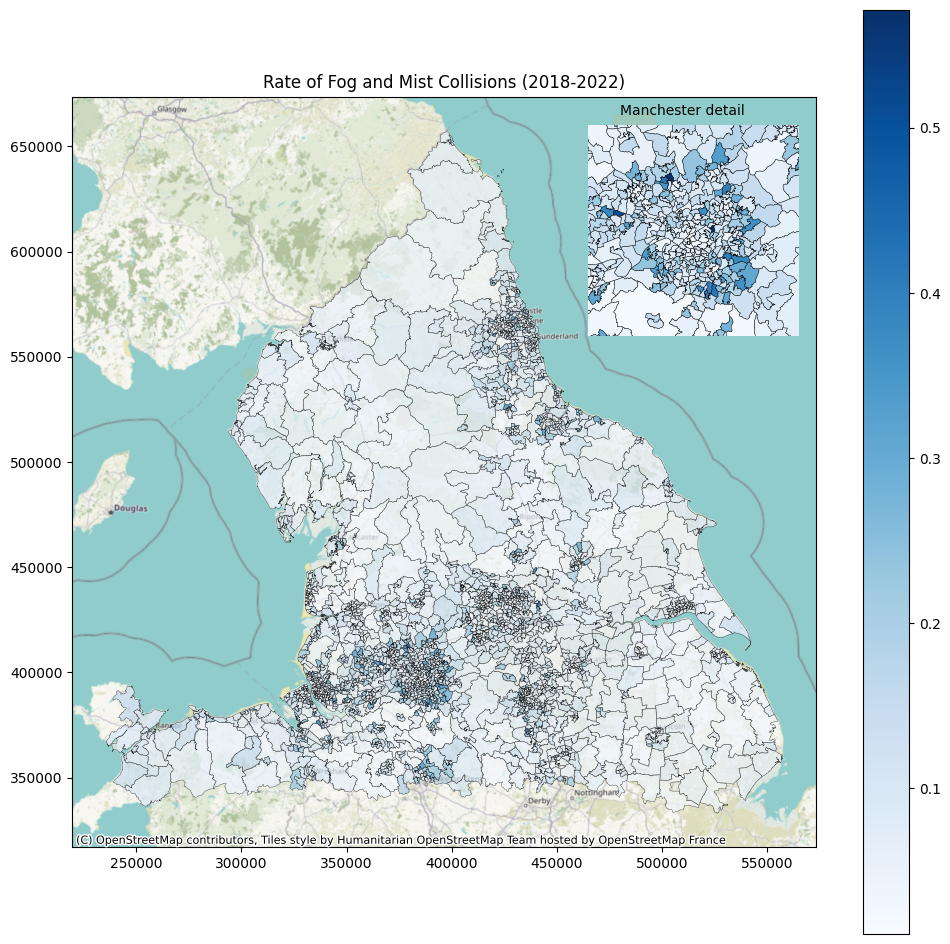

In [120]:
xmin, xmax = 250000, 550000
ymin, ymax = 350000, 700000
stats19_choro_gdf_27700_north = stats19_choro_gdf_27700.cx[xmin:xmax, ymin:ymax]

fig, ax1 = plt.subplots(figsize=(12,12))

ax1 = stats19_choro_gdf_27700_north.plot(
    column='fog_or_mist_collisions_2018_2022_rate',
    figsize=(15,10),
    legend=True,
    cmap='Blues',
    edgecolor='black',
    linewidth=0.3,
    ax=ax1,
    alpha=0.7
    )

ax2 = ax1.inset_axes(
    [440000, 560000, 150000, 100000],
    transform=ax1.transData,
    xlim=(360000,410000),
    ylim=(375000,425000)
    )

ax2 = stats19_choro_gdf_27700_north.plot(
    column='fog_or_mist_collisions_2018_2022_rate',
    figsize=(15,10),
    cmap='Blues',
    edgecolor='black',
    linewidth=0.3,
    ax=ax2
    )

plt.title("Rate of Fog and Mist Collisions (2018-2022)")

cx.add_basemap(
    ax1,
    crs=stats19_choro_gdf_27700_north.crs.to_string(),
    zoom=8
)

ax1.text(480000,665000, "Manchester detail", fontsize="medium")

#ax1.axis('off')
ax2.axis('off')

### 2. For the point map of stats19 data, work out how you could make the point size correspond to severity - so 'fatal' accidents will have the largest point size.

c:\Users\Sammi\Anaconda3\envs\geographic\Lib\site-packages\geopandas\geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


(-0.08798515000000001, 1.84782015, 50.586789749999994, 53.89214125)

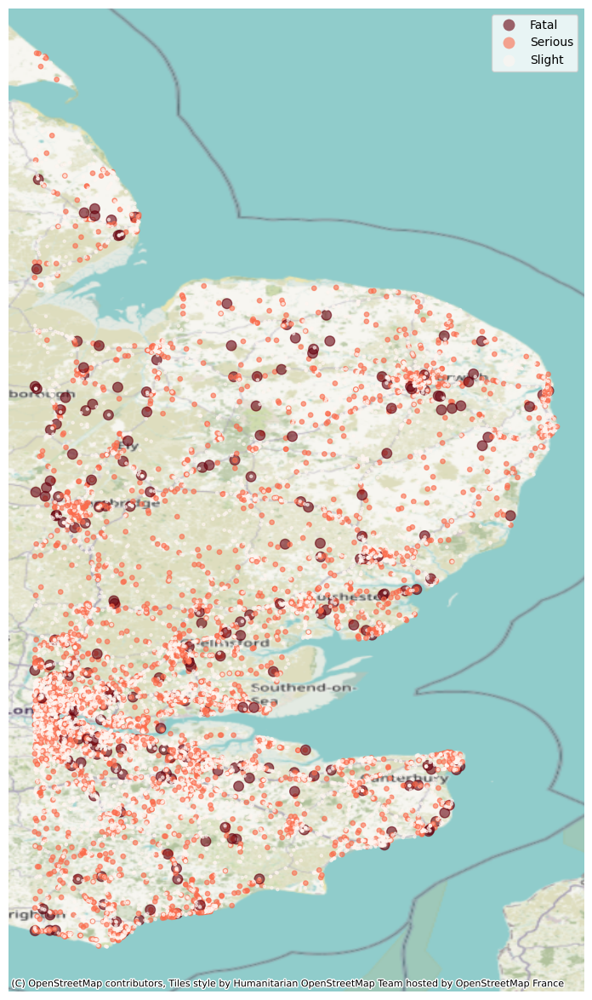

In [131]:
import numpy as np

# This is one way of creating a conditional column when you only have a couple of possible states
stats19_collisions_gdf_27700_se['severity_point_size'] = np.where(
    stats19_collisions_gdf_27700_se["accident_severity"] == "Fatal", 70, # if fatal, return '70'
    # if not fata, check whether equal to serious
    # if equal to serious, return 15, else return 5
    np.where(stats19_collisions_gdf_27700_se["accident_severity"] == "Serious", 15, 5)
)

ax = stats19_collisions_gdf_27700_se.plot(
    column="accident_severity",
    legend=True,
    alpha=0.6,
    cmap="Reds_r",
    figsize=(25,15),
    markersize=stats19_collisions_gdf_27700_se['severity_point_size']
    )

cx.add_basemap(
    ax,
    crs=stats19_collisions_gdf_27700_se.crs.to_string(),
    zoom=8
)

ax.axis('off')

### 3. Return to your final version of the dentist map. How could you display the data on here more clearly? 

Consider what might be most interesting. Is it the dentists with the most or least UDA delivered?

Hint: you may need to adapt the example here: https://adjusttext.readthedocs.io/en/latest/Examples-for-multiple-subplots.html


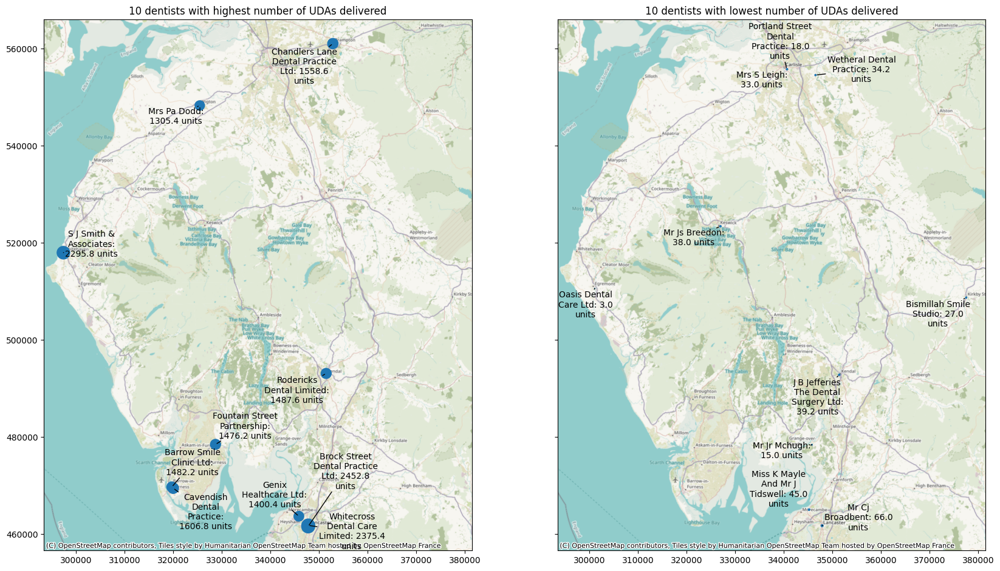

In [212]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,30), sharex='all', sharey='all')

dentist_activity_dec_2023['point_size'] = dentist_activity_dec_2023['UDA_DELIVERED'] / 10

dentist_activity_dec_2023["label"] = dentist_activity_dec_2023.apply(
    lambda x: f"{x.PROVIDER_NAME.title()}: {x.UDA_DELIVERED} units",
    axis=1
)

highest = dentist_activity_dec_2023.sort_values("UDA_DELIVERED").tail(10)
lowest = dentist_activity_dec_2023.sort_values("UDA_DELIVERED").head(10)

# Consider whether you could adapt the next bit into a function to reduce repetition!
# it could take an axis object and a dataframe as arguments.


# Plot for 10 highest

ax1 = highest.plot(
    markersize=highest['point_size'],
    ax=ax1
    )

# Repeat for 10 fewest
ax2 = lowest.plot(
    markersize=lowest['point_size'],
    ax=ax2
    )

# Add basemaps in a loop for subplots
for ax in [ax1, ax2]:
    cx.add_basemap(
        ax,
        crs=dentist_activity_dec_2023.crs.to_string(),
        zoom=10
    )

# Create labels
## ax1 labels
texts_highest = []

for x, y, label in zip(highest.geometry.x, highest.geometry.y, highest.label):
    wrapped_label = textwrap.fill(label,15)
    texts_highest.append(ax1.text(x, y, wrapped_label, ha='center', va='center'))

## ax2 labels
texts_lowest = []

for x, y, label in zip(lowest.geometry.x, lowest.geometry.y, lowest.label):
    wrapped_label = textwrap.fill(label,15)
    texts_lowest.append(ax2.text(x, y, wrapped_label, ha='center', va='center'))

# Adjust label position

adjust_text(
    texts_highest,
    ax=ax1,
    arrowprops=dict(arrowstyle="-", color='k', lw=1)
)

adjust_text(
    texts_lowest,
    arrowprops=dict(arrowstyle="-", color='k', lw=1),
    ax=ax2
)

# Set titles

ax1.title.set_text("10 dentists with highest number of UDAs delivered")
ax2.title.set_text("10 dentists with lowest number of UDAs delivered")

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=5b9a0342-1ee9-4024-886e-fd3cfaca1c00' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>